In [105]:
import numpy as np 
import pandas as pd 
import os
import seaborn as sns 
import random
from matplotlib import pyplot as plt
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import models
import torchvision.transforms as transforms
import torch.optim as optim
from skimage import io
import torch.nn.functional as F
import torch.nn as nn
from torch.optim.lr_scheduler import CosineAnnealingLR

In [106]:
labels=pd.read_csv('/Users/killercookie/Brain MRI/Alzheimer/label.csv')
labels

,id,label
0,2b70a7c4-b97a-4887-8e5f-85c079e7b275.jpg,VeryMildDemented
1,59bfe517-a5b4-4dd3-8e32-07fba7a77aa9.jpg,VeryMildDemented
2,ef1d73c2-679f-4421-b7c5-06881d487cf0.jpg,VeryMildDemented
3,verymildDem180.jpg,VeryMildDemented
4,716c42f4-f92c-40cd-9088-6254973a6665.jpg,VeryMildDemented
...,...,...
35197,nonDem2188.jpg,NonDemented
35198,cdc6a5b1-a49e-4377-bd5f-f0c58c3d6979.jpg,NonDemented
35199,de8a3149-c5d0-478a-b44e-c9c5fc61c2dd.jpg,NonDemented
35200,nonDem1481.jpg,NonDemented


In [107]:
label_count=labels.groupby(by="label", as_index=False).count().sort_values(by="id", ascending=False)
label_count

,label,id
2,NonDemented,12800
3,VeryMildDemented,11200
1,ModerateDemented,6528
0,MildDemented,4674


In [108]:
with_50_classes=label_count[:50]
with_50_classes

,label,id
2,NonDemented,12800
3,VeryMildDemented,11200
1,ModerateDemented,6528
0,MildDemented,4674


In [109]:
list_50_classes=list(with_50_classes["label"])
labels_50=labels.query('label in @list_50_classes').reset_index(drop=True)
labels_50

,id,label
0,2b70a7c4-b97a-4887-8e5f-85c079e7b275.jpg,VeryMildDemented
1,59bfe517-a5b4-4dd3-8e32-07fba7a77aa9.jpg,VeryMildDemented
2,ef1d73c2-679f-4421-b7c5-06881d487cf0.jpg,VeryMildDemented
3,verymildDem180.jpg,VeryMildDemented
4,716c42f4-f92c-40cd-9088-6254973a6665.jpg,VeryMildDemented
...,...,...
35197,nonDem2188.jpg,NonDemented
35198,cdc6a5b1-a49e-4377-bd5f-f0c58c3d6979.jpg,NonDemented
35199,de8a3149-c5d0-478a-b44e-c9c5fc61c2dd.jpg,NonDemented
35200,nonDem1481.jpg,NonDemented


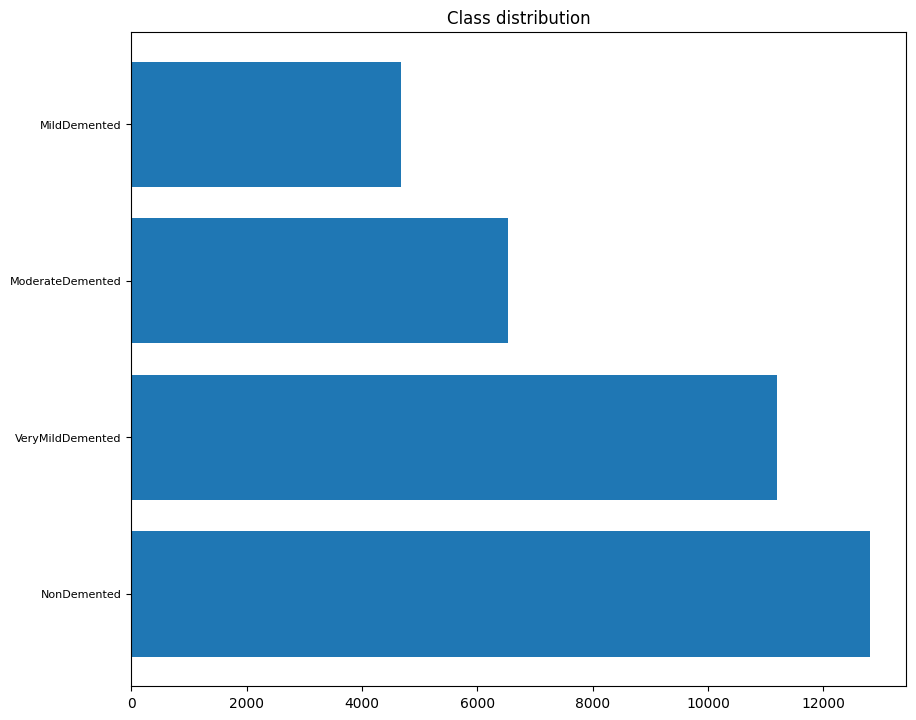

In [110]:
fig, ax = plt.subplots(figsize=(10, 8.5))
ax=plt.barh(with_50_classes["label"], with_50_classes["id"])
plt.title("Class distribution")
plt.xticks(fontsize = 10) 
plt.yticks(fontsize = 8) 
plt.show()

In [111]:
img_file='/Users/killercookie/Brain MRI/Alzheimer/MRI'
df2 =labels_50.assign(img_path=lambda x: img_file + x['id'])
df2

,id,label,img_path
0,2b70a7c4-b97a-4887-8e5f-85c079e7b275.jpg,VeryMildDemented,/Users/killercookie/Brain MRI/Alzheimer/MRI2b7...
1,59bfe517-a5b4-4dd3-8e32-07fba7a77aa9.jpg,VeryMildDemented,/Users/killercookie/Brain MRI/Alzheimer/MRI59b...
2,ef1d73c2-679f-4421-b7c5-06881d487cf0.jpg,VeryMildDemented,/Users/killercookie/Brain MRI/Alzheimer/MRIef1...
3,verymildDem180.jpg,VeryMildDemented,/Users/killercookie/Brain MRI/Alzheimer/MRIver...
4,716c42f4-f92c-40cd-9088-6254973a6665.jpg,VeryMildDemented,/Users/killercookie/Brain MRI/Alzheimer/MRI716...
...,...,...,...
35197,nonDem2188.jpg,NonDemented,/Users/killercookie/Brain MRI/Alzheimer/MRInon...
35198,cdc6a5b1-a49e-4377-bd5f-f0c58c3d6979.jpg,NonDemented,/Users/killercookie/Brain MRI/Alzheimer/MRIcdc...
35199,de8a3149-c5d0-478a-b44e-c9c5fc61c2dd.jpg,NonDemented,/Users/killercookie/Brain MRI/Alzheimer/MRIde8...
35200,nonDem1481.jpg,NonDemented,/Users/killercookie/Brain MRI/Alzheimer/MRInon...


# Train-test split

In [115]:
# Set random seed for reproducibility
random.seed=42

# Load the original DataFrame
df2 = pd.read_csv('/Users/killercookie/Brain MRI/Alzheimer/label.csv')  # Replace with actual CSV file path

# Generate train and test indices
train_indices = random.sample(list(range(len(df2))), int(len(df2) * 0.8))
test_indices = [i for i in list(range(len(df2))) if i not in train_indices]

# Split data into train and test DataFrames
train_labels = df2.iloc[train_indices].reset_index(drop=True)
test_labels = df2.iloc[test_indices].reset_index(drop=True)

# Update img_path to include the label as a subfolder
train_labels['img_path'] = train_labels.apply(
    lambda row: f"/Users/killercookie/Brain MRI/Alzheimer/MRI/{row['label']}/{row['id']}", axis=1
)
test_labels['img_path'] = test_labels.apply(
    lambda row: f"/Users/killercookie/Brain MRI/Alzheimer/MRI/{row['label']}/{row['id']}", axis=1
)

# Save to CSV
train_labels.to_csv('train_labels.csv', index=False)
test_labels.to_csv('test_labels.csv', index=False)

print("CSV files have been updated and saved.")

CSV files have been updated and saved.


In [116]:
df2.to_csv('labels_50.csv',index=False)

In [117]:
map_labels = dict()
for index, row in with_50_classes.reset_index(drop=True).iterrows():
    map_labels[row["label"]] = index
    
print(len(map_labels))
map_labels

4


{'NonDemented': 0,
 'VeryMildDemented': 1,
 'ModerateDemented': 2,
 'MildDemented': 3}

In [118]:
inverse_map=dict()
for label in map_labels:
    inverse_map[map_labels[label]]=label
inverse_map

{0: 'NonDemented',
 1: 'VeryMildDemented',
 2: 'ModerateDemented',
 3: 'MildDemented'}

## Dataset funcions

In [119]:
class BrainMRIDataset_train(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.labels = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform['train']
        
    def __len__(self):
        return self.labels.shape[0]
    
    def __getitem__(self, index):
        label_name = self.labels.iloc[index, 1]
        img_path = os.path.join(self.root_dir, label_name, self.labels.iloc[index, 0])
        
        image = io.imread(img_path)
        
        y_label = torch.tensor(int(map_labels[label_name]))

        if self.transform:
            image = self.transform(image)
            
        return (image, y_label)

In [120]:
class BrainMRIDataset_test(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.name_images = pd.read_csv(csv_file)['id'].values
        self.root_dir = root_dir
        self.transform = transform['test']
        
    def __len__(self):
        return len(self.name_images)
    
    def __getitem__(self, index):
        img_path = os.path.join(self.root_dir, self.name_images[index])
        image = io.imread(img_path)
     
        if self.transform:
            image = self.transform(image)

        return image

In [147]:
transform = {'train': transforms.Compose([
        transforms.ToPILImage(),
        transforms.Grayscale(3),
        transforms.Resize((224, 224)),
        transforms.RandomResizedCrop(size=256, scale=(0.95, 1.0)),
        transforms.RandomRotation(degrees=15),
        transforms.ColorJitter(),
        transforms.RandomHorizontalFlip(),
        transforms.CenterCrop(size=224), 
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])]),
    'test': transforms.Compose([transforms.ToPILImage(),
                                      transforms.RandomResizedCrop(size=256, scale=(0.95, 1.0)),
                                      transforms.CenterCrop(size=224),
                                      transforms.ToTensor(),
                                     transforms.Normalize([0.485, 0.456, 0.406],
                                                          [0.229, 0.224, 0.225])])}


In [212]:
num_classes = 4
learning_rate = 1e-3
batch_size = 128
num_epochs = 5
lr_ratio=0.005

In [213]:
dataset = BrainMRIDataset_train('/Users/killercookie/Brain MRI/train_labels.csv', '/Users/killercookie/Brain MRI/Alzheimer/MRI', transform)
train_set_size = int(len(dataset) * 0.8)
print("Train set length: ", train_set_size)
valid_set_size = len(dataset) - train_set_size
print("Validation set length: ", valid_set_size)
train_set, valid_set = torch.utils.data.random_split(dataset, [train_set_size, valid_set_size])
train_loader = DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(dataset=valid_set, batch_size=batch_size, shuffle=True)

test_data = BrainMRIDataset_test('/Users/killercookie/Brain MRI/test_labels.csv', '/Users/killercookie/Brain MRI/Alzheimer/MRI', transform=transform)
print("Test set length: ",len(test_data))
test_loader = DataLoader(test_data, batch_size=batch_size)

Train set length:  22528
Validation set length:  5633
Test set length:  7041


## Functions for training

In [214]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device")
print(device)

Device
cpu


In [215]:
# save checkpoint
def save_checkpoint(state, filename="my_checkpoint.pth.tar"):
    torch.save(state, filename)

# load checkpint
def load_checkpoint(checkpoint, model, optimizer):
    print("Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])
    scheduler = checkpoint['scheduler']

In [216]:
def plot_results(training_accuracy_list, training_loss_list, validation_accuracy_list, validation_loss_list):
    epochs = len(training_accuracy_list)
    x = np.arange(1, epochs + 1)

    training_accuracy_list = [item.cpu().numpy() if isinstance(item, torch.Tensor) else item for item in training_accuracy_list]
    training_loss_list = [item.cpu().numpy() if isinstance(item, torch.Tensor) else item for item in training_loss_list]
    validation_accuracy_list = [item.cpu().numpy() if isinstance(item, torch.Tensor) else item for item in validation_accuracy_list]
    best_loss_list = [item.cpu().numpy() if isinstance(item, torch.Tensor) else item for item in validation_loss_list]
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].plot(x, training_accuracy_list, label='Training Accuracy', color='blue')
    axes[1].plot(x, training_loss_list, label='Training Loss', color='orange')
    axes[0].plot(x, validation_accuracy_list, label='Validation Accuracy', color='green')
    axes[1].plot(x, best_loss_list, label='Validation Loss', color='red')

    fig.suptitle('Model Evaluation Metrics')
    axes[0].set_xlabel('Epochs')
    axes[0].legend()
    axes[0].grid(True)
    axes[1].set_xlabel('Epochs')
    axes[1].legend()
    axes[1].grid(True)
    plt.show()

In [217]:
def validation(model, device, valid_loader, loss_function):

    model.eval()
    loss_total = 0
    correct = 0
    
    with torch.no_grad():
        for data in valid_loader:
            input = data[0].to(device)
            label = data[1].to(device)
            output = model(input)
            _, predicted = output.max(1)
            loss = loss_function(output, label)
            loss_total += loss.item()
            correct+= (predicted == label).sum()
        validation_accuracy = correct/len(valid_loader.sampler)
    return loss_total / len(valid_loader), validation_accuracy

In [218]:
def traindata(device, model, epochs, optimizer, scheduler, loss_function, train_loader, valid_loader, filename):
    # Early stopping
    best_loss = float('inf')
    patience = 5
    trigger_times = 0

    # Lists to store data for plotting
    training_accuracy_list = []
    training_loss_list = []
    best_loss_list = []
    validation_accuracy_list = []
    validation_loss_list = []

    # Check that model and inputs are on the correct device
    for name, param in model.named_parameters():
        if param.device != device:
            print(f"Parameter {name} is not on the correct device!")
            param = param.to(device)
    print("Device check complete.")

    for epoch in range(1, epochs+1):
        print(f'Starting epoch {epoch}...')
        model.train()
        correct = 0
        loss_total = 0
        
        for batch_idx, data in enumerate(train_loader, 1):
            print(f"Processing batch {batch_idx}")
            
            inputs = data[0].to(device)
            labels = data[1].to(device)

            print("Inputs and labels transferred to device")

            optimizer.zero_grad()
            
            output = model(inputs)
            print("Model output obtained")

            _, predicted = output.max(1)
            print("Predictions made")

            loss = loss_function(output, labels)
            print(f"Loss computed: {loss.item()}")

            loss_total += loss.item()
            correct += (predicted == labels).sum().item()

            loss.backward()
            print("Backpropagation complete")

            optimizer.step()
            print("Optimizer step complete")

            scheduler.step()
            print("Scheduler step complete")

            if batch_idx % 10 == 0 or batch_idx == len(train_loader):
                print(f'Epoch {epoch}, Batch {batch_idx}/{len(train_loader)}: Loss = {loss.item():.4f}')
        
        # Epoch training metrics
        training_accuracy = correct / len(train_loader.dataset)
        print(f"Training accuracy: {training_accuracy}")

        training_loss = loss_total / len(train_loader)
        print(f"Training loss: {training_loss}")

        
        print(f'Epoch {epoch} completed.')
        
        # Validation
        model.eval()
        with torch.no_grad():
            current_loss, validation_accuracy = validation(model, device, valid_loader, loss_function)
        
        print(f'Epoch {epoch} Summary:')
        print(f'Training Accuracy: {training_accuracy:.4f}, Training Loss: {training_loss:.4f}')
        print(f'Validation Accuracy: {validation_accuracy:.4f}, Validation Loss: {current_loss:.4f}\n')
        
        # Append values to lists for plotting
        training_accuracy_list.append(training_accuracy)
        training_loss_list.append(training_loss)
        validation_accuracy_list.append(validation_accuracy)
        validation_loss_list.append(current_loss)
        best_loss_list.append(best_loss)

        # Early stopping
        if current_loss > best_loss:
            trigger_times += 1
            print(f'Early stopping trigger times: {trigger_times}/{patience}')
            
            if trigger_times >= patience:
                print('Early stopping! Exiting training loop.')
                break
        else:
            print('Validation loss improved; saving model checkpoint.')
            trigger_times = 0
            best_loss = current_loss
            save_checkpoint({"state_dict": model.state_dict(), "optimizer": optimizer.state_dict(), "scheduler": scheduler.state_dict()}, filename)
    
    print('Training complete. Plotting results...')
    plot_results(training_accuracy_list, training_loss_list, validation_accuracy_list, validation_loss_list)
    
    return model

In [219]:
def test(device, model, test_loader, loss_function):
    model.eval()
    predictions = pd.DataFrame()
    with torch.no_grad():
        for data in test_loader:
            input = data.to(device)
            output = model(input)
            m = nn.Softmax(dim=1)
            res = m(output)
            predictions = pd.concat([predictions, pd.DataFrame(torch.Tensor.cpu(res).numpy(), columns = list(map_labels.keys()))], ignore_index=True)
        return (predictions)

# Resnet50

In [220]:
model_resnet = models.resnet50(pretrained=True)

for param in model_resnet.parameters():
    param.requires_grad = False
    
model_resnet.fc = nn.Linear(2048, num_classes) 
model_resnet = model_resnet.to(device=device)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [221]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_resnet.parameters(), lr=learning_rate)
scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=learning_rate * lr_ratio)
checkpoint = {"state_dict": model_resnet.state_dict(), "optimizer": optimizer.state_dict(), "scheduler": scheduler}

In [222]:
model = traindata(device, model_resnet, num_epochs, optimizer, scheduler, criterion, train_loader, valid_loader, "resnet_checkpoint.pth.tar")

Device check complete.
Starting epoch 1...
Processing batch 1
Inputs and labels transferred to device
Model output obtained
Predictions made
Loss computed: 1.306843876838684
Backpropagation complete
Optimizer step complete
Scheduler step complete
Processing batch 2
Inputs and labels transferred to device
Model output obtained
Predictions made
Loss computed: 1.4159011840820312
Backpropagation complete
Optimizer step complete
Scheduler step complete
Processing batch 3
Inputs and labels transferred to device
Model output obtained
Predictions made
Loss computed: 1.3670529127120972
Backpropagation complete
Optimizer step complete
Scheduler step complete
Processing batch 4
Inputs and labels transferred to device
Model output obtained
Predictions made
Loss computed: 1.4207229614257812
Backpropagation complete
Optimizer step complete
Scheduler step complete
Processing batch 5
Inputs and labels transferred to device


KeyboardInterrupt: 

In [188]:
load_checkpoint(torch.load("resnet_checkpoint.pth.tar"), model_resnet, optimizer)

Loading checkpoint


In [ ]:
df = test(device, model, test_loader, criterion)
df=pd.concat([df, test_labels["label"]], axis=1)
df.to_csv('resnet50.csv', index=False)
df

# Evaluation

In [39]:
resnet50=pd.read_csv("/kaggle/input/prediction/resnet50.csv")
effnet=pd.read_csv("/kaggle/input/prediction/efficientnet.csv")
mobnet=pd.read_csv("/kaggle/input/prediction/mobilenet.csv")
myconv=pd.read_csv("/kaggle/input/prediction/myconv.csv")
vgg=pd.read_csv("/kaggle/input/prediction/vgg16.csv")

In [40]:
def top_p_percent_acc(data, p):
    cat_num=len(list(data.columns))-1  #number of categories = number of columns - 2 (number of picture, true_label)
    test_size=len(list(data.index)) #number of validation data points
    p_percent=int(p/100*cat_num) #p percent of the validation size
    acc=0
    for row,i in data.iterrows():
        best_p_indices=np.array(i[:len(i)-1]).argsort()[-p_percent:][::-1]  #the p% largest probabilities
        best_p_columns=[data.columns[j] for j in best_p_indices]  #the corresponding classes
        true_label=str(i["breed"]) #str(train.loc[i["picture"],"landmark_id"])  #the true class of the data point
        if true_label in best_p_columns:
            acc+=1
    acc=acc/test_size
    return acc

In [41]:
def top_p_percent_plot(data, P_list):
    cat_num=len(list(data.columns))-1  #number of categories = number of columns - 2 (number of picture, true_label)
    test_size=len(list(data.index)) #number of validation data points

    values=[]
    for p in P_list:
        acc=top_p_percent_acc(data, p)
        values.append(acc)

    plt.plot(P_list, values, color="green")
    plt.title('P-percent accuracies')
    plt.xlabel('P values')
    plt.ylabel('P-Accuracy')
    #plt.ylim([-0.05, 1.05])

    plt.show()

In [42]:
def multiple_data_ppercent(l):
    cat_num=len(list(l[0][0].columns))-1 
    test_size=len(list(l[0][0].index))
    for i in l:
        data, P_list, name = i
        values=[]
        for p in P_list:
            acc=top_p_percent_acc(data, p)
            values.append(acc)
        plt.plot(P_list, values, label=name)
    plt.title('P-percent accuracies')
    plt.xlabel('P values')
    plt.ylabel('P-Accuracy')
    plt.grid(True)
    plt.legend()
    plt.show()
        

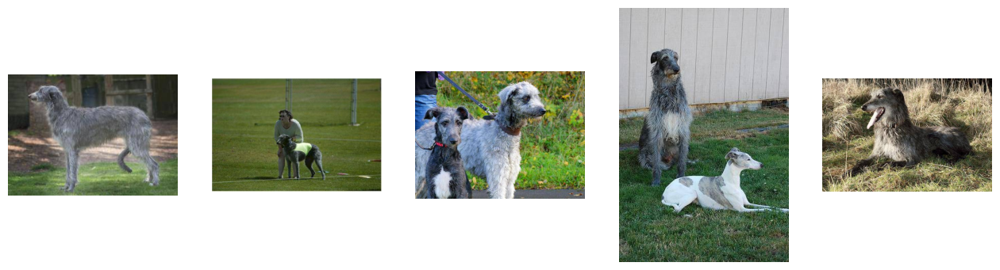

In [43]:
import matplotlib.image as mpimg
def plot_images(class_name):
    
    image_ids = labels_50[labels_50['breed'] == str(class_name)]['id'].values
    folder="/kaggle/input/dog-breed-identification-data/train/"
    image_path=[]
    for i in image_ids:
        image_path.append(folder+str(i)+".jpg")
        
    fig = plt.gcf()
    fig.set_size_inches(16, 16)
    next_pix = image_path
    random.shuffle(next_pix)
    for i, img_path in enumerate(next_pix[0:5]):
        sp = plt.subplot(1, 5, i + 1)
        sp.axis('Off')
        img = mpimg.imread(img_path)
        plt.imshow(img)
    plt.show()
    
plot_images(inverse_map[0])

In [44]:
def acc_class_size(data, title):  #we would like to investigate if the the accuracy and the size of the class are correlated
    accuracies=[] #this list will contain the accuracies of the classes
    sizes=[]
    #for class_num in data.columns[:len(data.columns)-2]:
        #accuracies=[] #this list will contain the accuracies of the classes
    for class_name in data.columns[:len(data.columns)-1]:
        class_data=data[data["breed"]==str(class_name)] #validation data points from this class
        acc=top_p_percent_acc(class_data, 2)    #accuracy of the validation data from this class
        accuracies.append(acc)
        #class_data=data[data["original_class"]==float(class_num)]  #validation data points from this class
        #acc=top_p_percent_acc(class_data, 2)    #accuracy of the validation data from this class
        #accuracies.append(acc)
        #class_size=train_labels[train_labels["breed"]==class_name]["label_count"].values[0] #size of the class
        class_size=with_50_classes[with_50_classes["breed"]==class_name]["id"].values[0]
        sizes.append(class_size)
    order=np.array(accuracies).argsort() #order the two list according to the accuracies
    accuracies=[accuracies[i] for i in order]
    sizes=[sizes[i] for i in order]
    sizes=[(sizes[i]-min(sizes))/(max(sizes)-min(sizes)) for i in range(len(sizes))] #normalize the sizes into [0, 1]
    corr=round(np.corrcoef(accuracies, sizes)[0, 1],4)
    label="corr="+str(corr)
    plt.scatter(accuracies, sizes, label=label)
    plt.title(title)
    plt.ylabel("Size of the class")
    plt.xlabel("Accuracy of the class")
    plt.legend()
    plt.show()

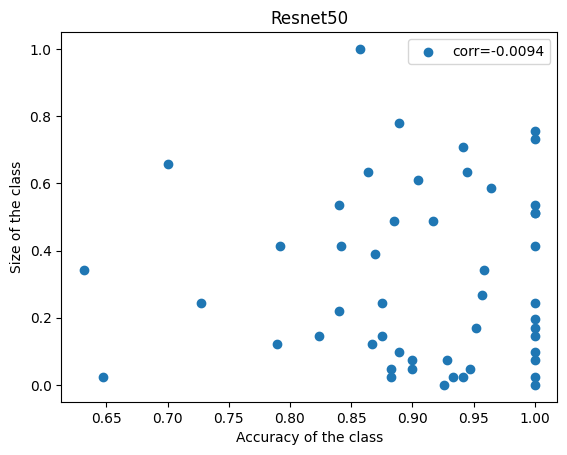

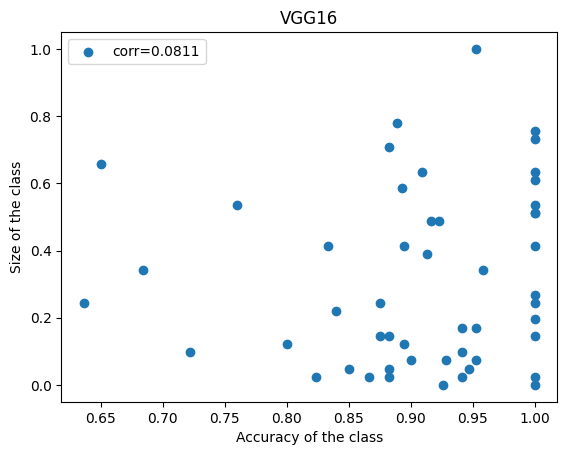

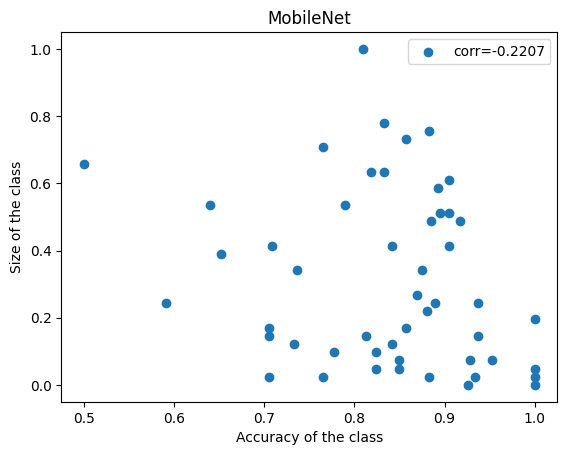

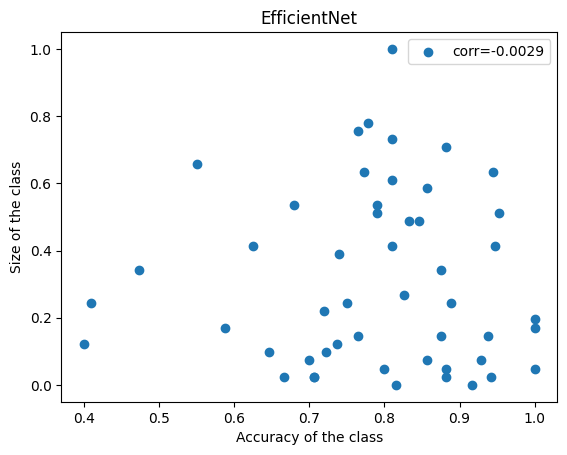

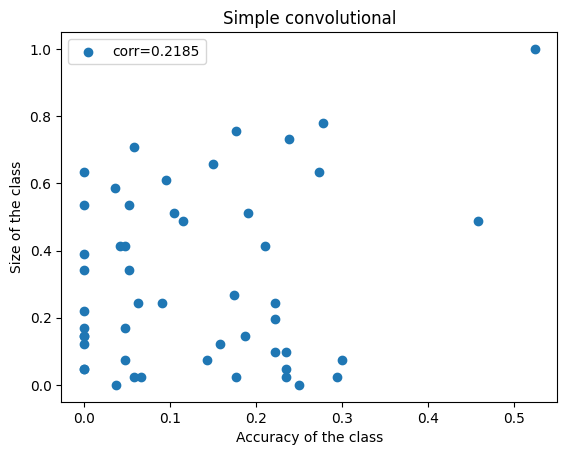

In [45]:
acc_class_size(resnet50, "Resnet50")
acc_class_size(vgg, "VGG16")
acc_class_size(mobnet, "MobileNet")
acc_class_size(effnet, "EfficientNet")
acc_class_size(myconv, "Simple convolutional")

scottish_deerhound
126


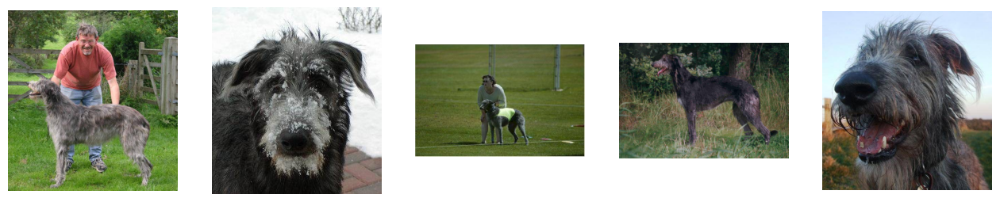

In [46]:
print(str(inverse_map[0]))
print(len(labels_50[labels_50['breed'] == str(inverse_map[0])]['id'].values))
plot_images(inverse_map[0])

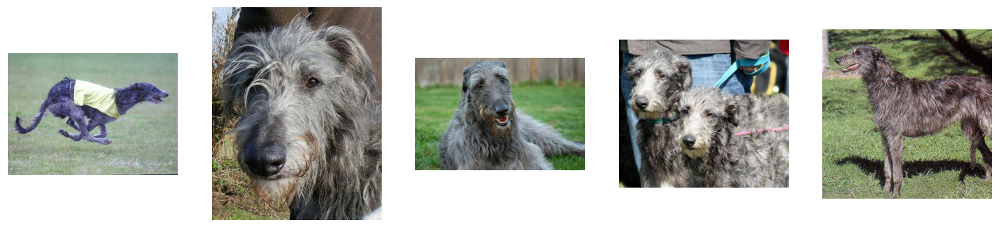

In [47]:
plot_images(inverse_map[0])

In [48]:
def best_worst_class(data):
    accuracies=[] #this list will contain the accuracies of the classes
    for class_name in data.columns[:len(data.columns)-1]:
        class_data=data[data["breed"]==str(class_name)] #validation data points from this class
        acc=top_p_percent_acc(class_data, 2)    #accuracy of the validation data from this class
        accuracies.append(acc)
    best_3_index=np.array(accuracies).argsort()[-3:][::-1]  #the indices of the 3 highest accuracy
    best_3_class=[class_data.columns[j] for j in best_3_index] #the 3 corresponding classes
    best_3_accuracy=[accuracies[j] for j in best_3_index]  #the 3 highest accuracy
    worst_3_index=np.array(accuracies).argsort()[:3]  #the indices of the 3 lowest accuracy
    worst_3_class=[class_data.columns[j] for j in worst_3_index] #the 3 corresponding classes
    worst_3_accuracy=[accuracies[j] for j in worst_3_index] #the 3 lowest accuracy

    print(f"The 3 highest accuracy: {best_3_accuracy}")
    print("Some examples from these 3 classes:")
    for i in best_3_class:
        plot_images(i)  #plot some picture from these classes -> it can be seen why it was so easy/difficult to classify these pictures
    print(f"The 3 lowest accuracy: {worst_3_accuracy}")
    print("Some examples from these 3 classes:")
    for i in worst_3_class:
        plot_images(i)

Resnet
The 3 highest accuracy: [1.0, 1.0, 1.0]
Some examples from these 3 classes:


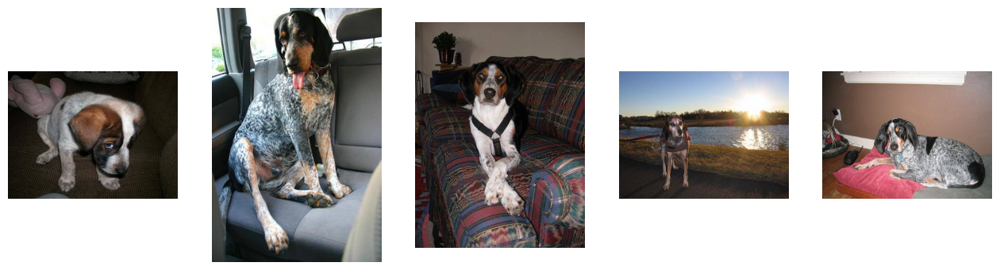

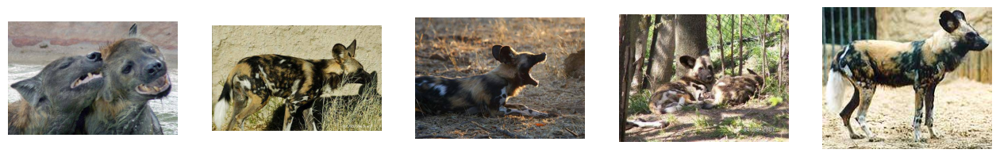

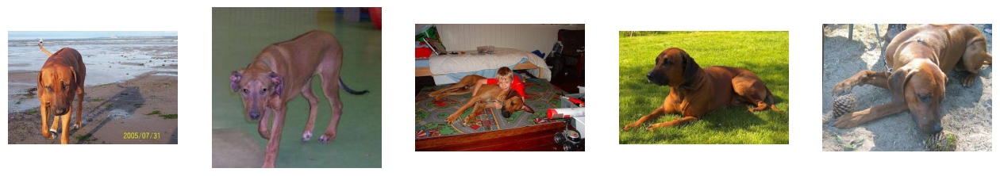

The 3 lowest accuracy: [0.631578947368421, 0.6470588235294118, 0.7]
Some examples from these 3 classes:


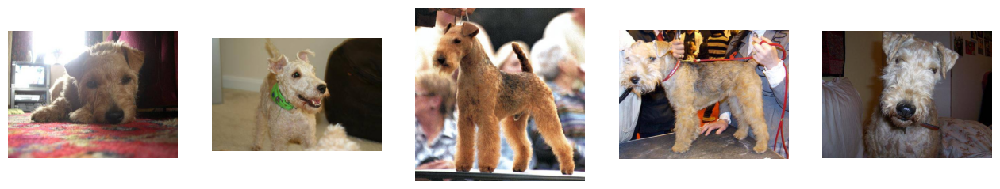

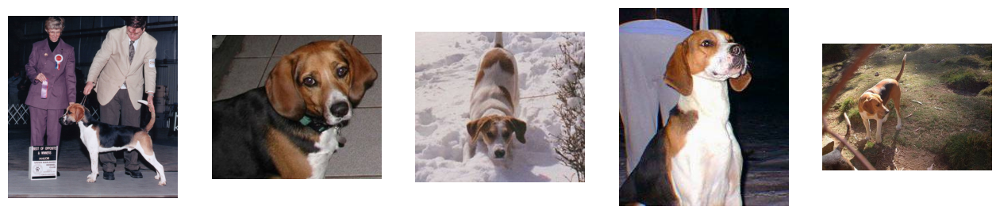

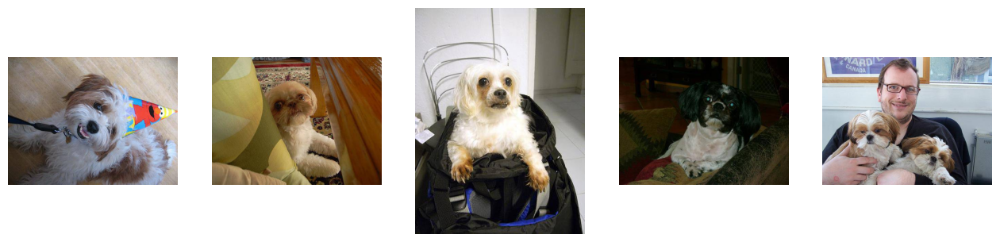




 VGG
The 3 highest accuracy: [1.0, 1.0, 1.0]
Some examples from these 3 classes:


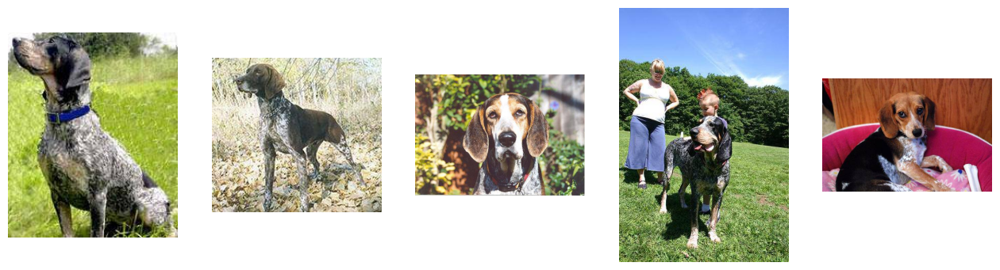

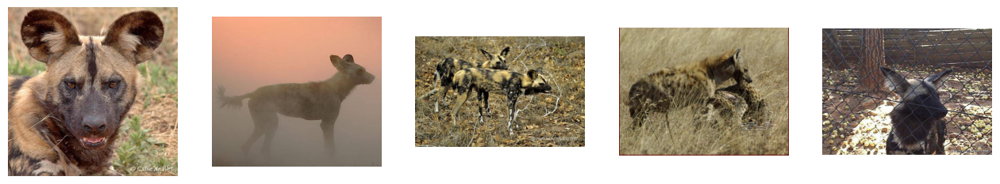

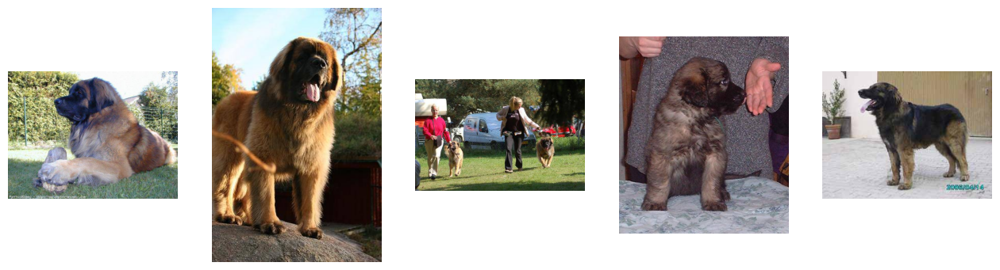

The 3 lowest accuracy: [0.6363636363636364, 0.65, 0.6842105263157895]
Some examples from these 3 classes:


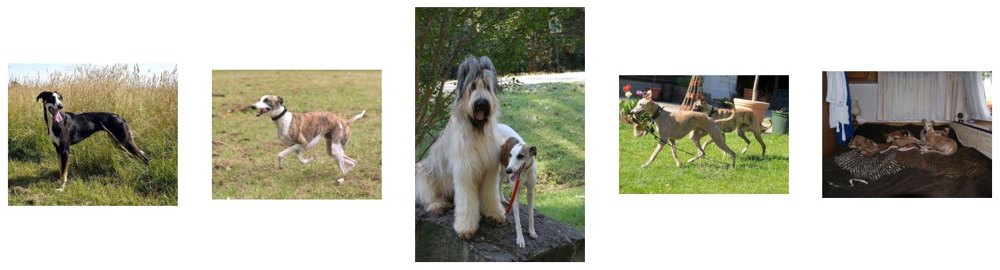

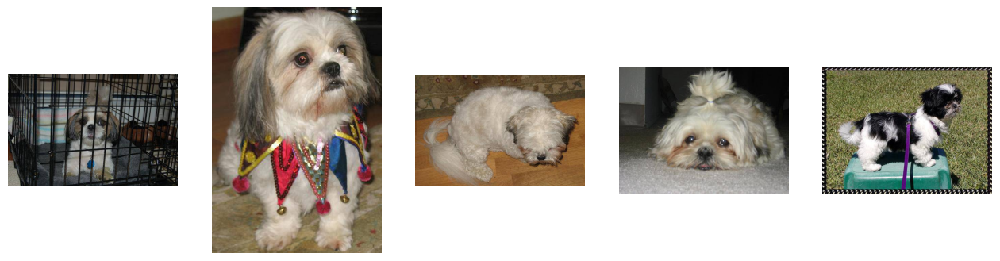

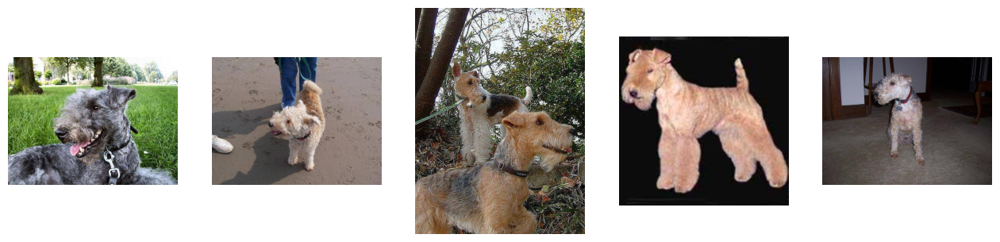




 simple conv
The 3 highest accuracy: [0.5238095238095238, 0.4583333333333333, 0.3]
Some examples from these 3 classes:


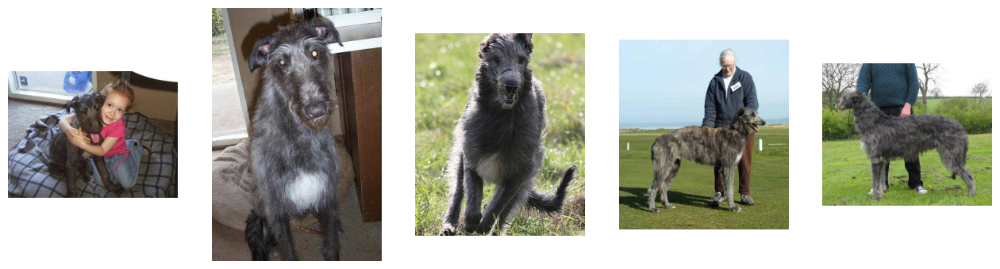

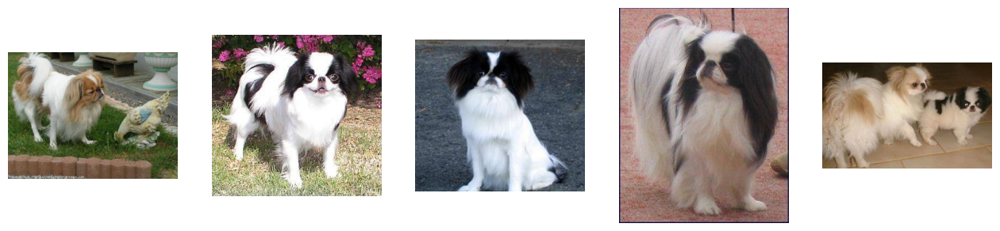

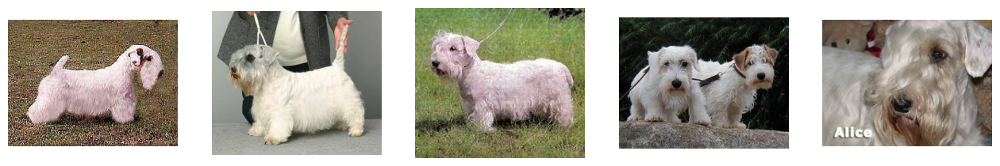

The 3 lowest accuracy: [0.0, 0.0, 0.0]
Some examples from these 3 classes:


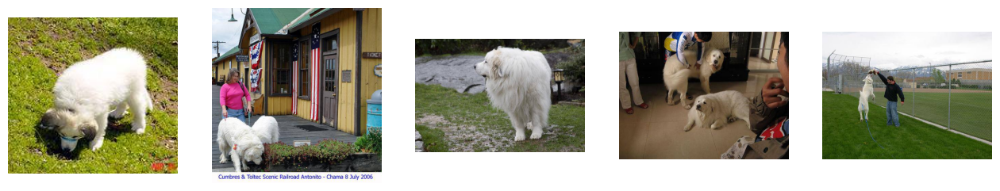

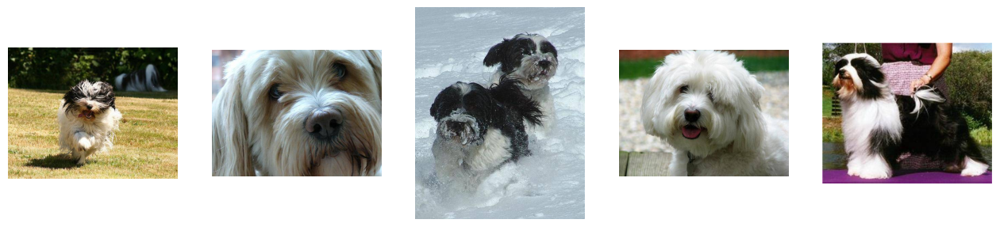

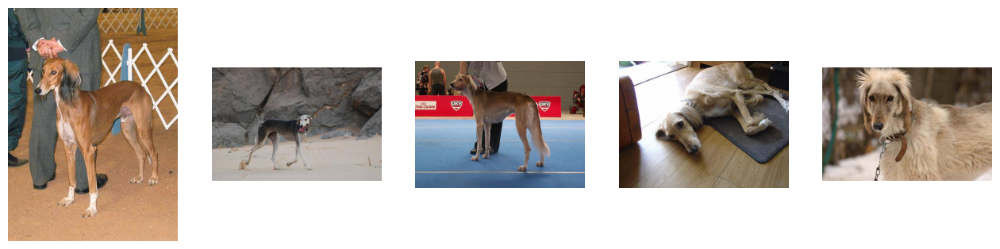




 mobnet
The 3 highest accuracy: [1.0, 1.0, 1.0]
Some examples from these 3 classes:


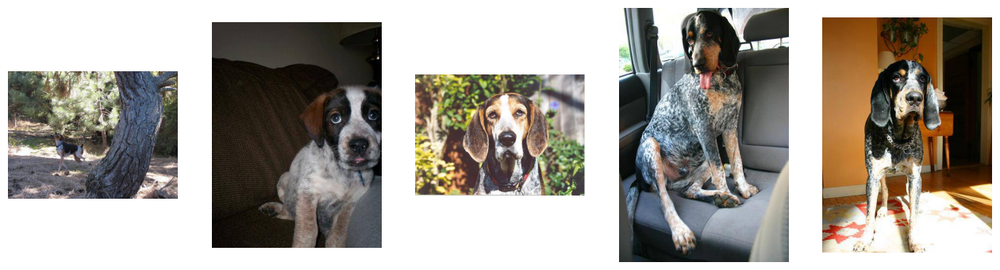

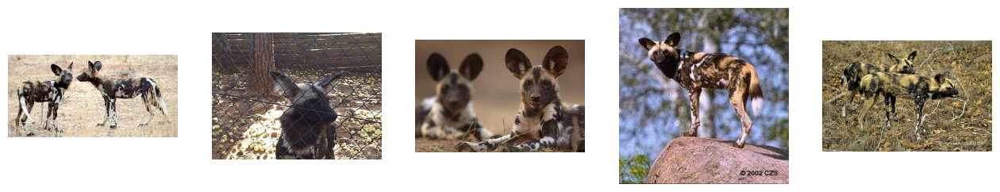

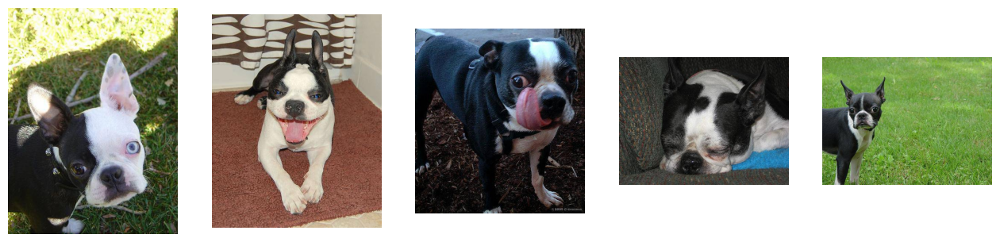

The 3 lowest accuracy: [0.5, 0.5909090909090909, 0.64]
Some examples from these 3 classes:


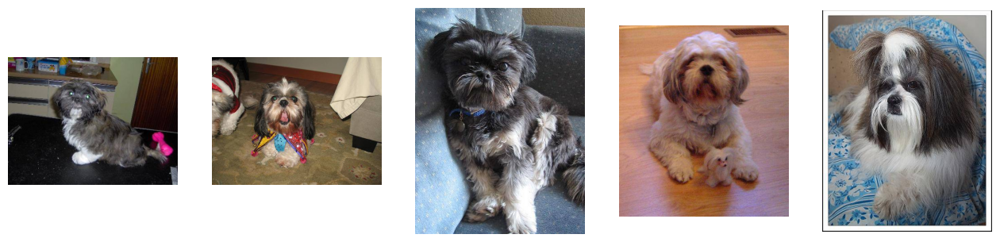

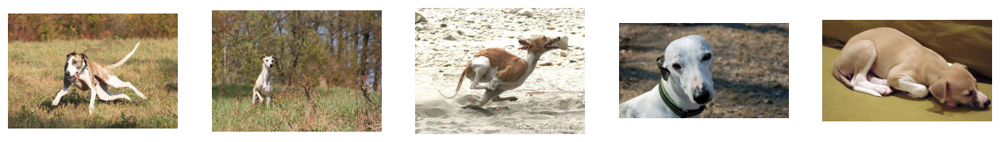

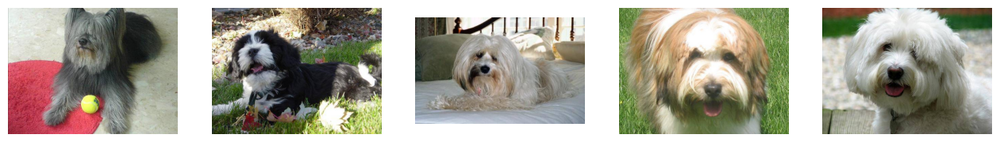




 effnet
The 3 highest accuracy: [1.0, 1.0, 1.0]
Some examples from these 3 classes:


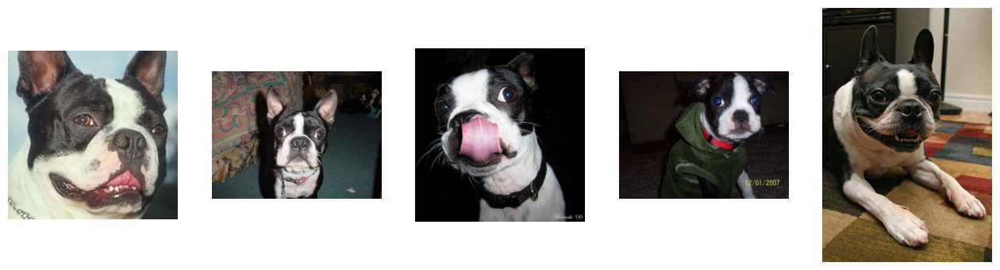

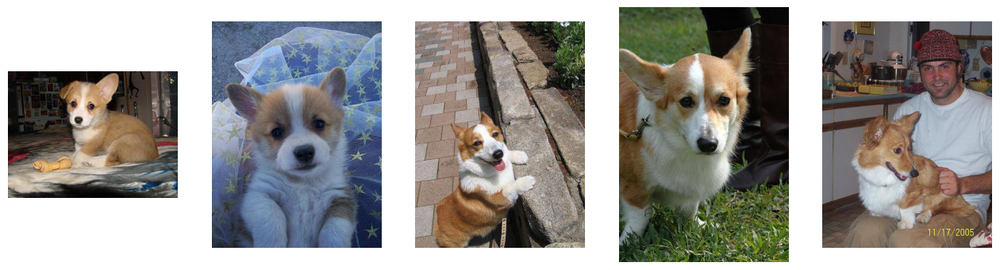

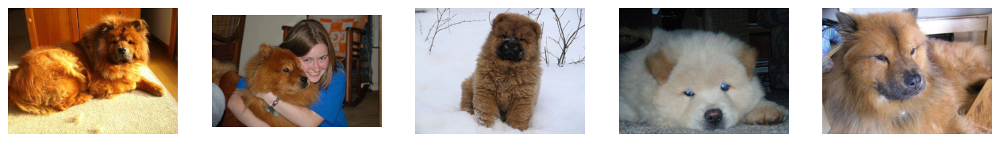

The 3 lowest accuracy: [0.4, 0.4090909090909091, 0.47368421052631576]
Some examples from these 3 classes:


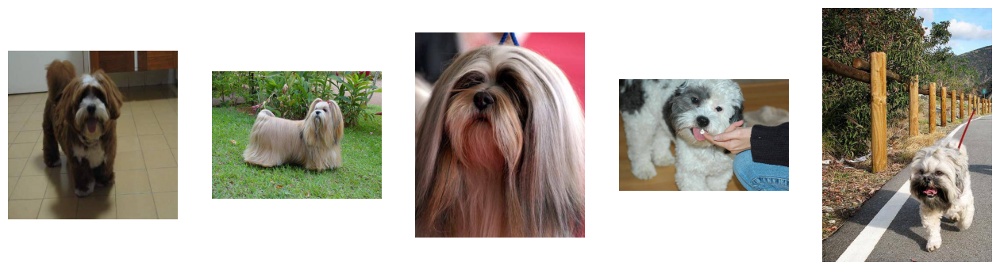

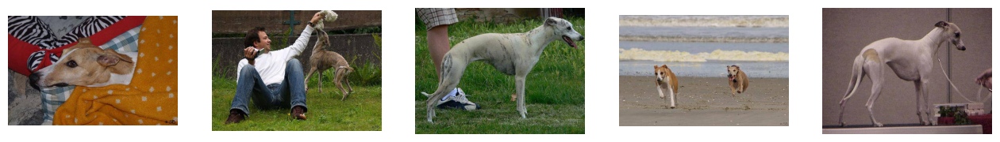

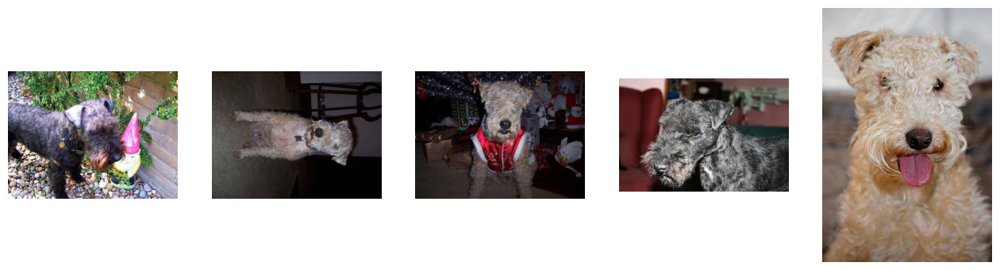

In [51]:
print("Resnet")
best_worst_class(resnet50)
print("\n\n\n", "VGG")
best_worst_class(vgg)
print("\n\n\n", "simple conv")
best_worst_class(myconv)
print("\n\n\n", "mobnet")
best_worst_class(mobnet)
print("\n\n\n", "effnet")
best_worst_class(effnet)

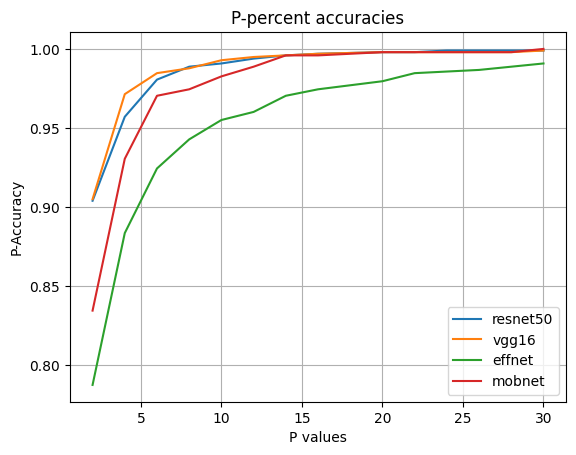

In [49]:
p=[2, 4, 6, 8, 10, 12, 14, 16, 20, 22, 24, 26, 28, 30]
multiple_data_ppercent([[resnet50, p, "resnet50"], [vgg, p, "vgg16"], [effnet, p, "effnet"], [mobnet, p, "mobnet"]])